# MUSE datacube - stellar spectra analysis
### Test of pySpecMUSE, package built on the procedures written by Giuseppe Milazzo for his thesis

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import pickle
from astropy.table import Table
import os

sys.path.append('/Users/katiagim/Desktop/PhD/pySpecMUSE/pySpecMUSE')
import pySpecMUSE as pSM

plt.rcdefaults()
#plt.rc('font',family='Bitstream Vera Serif')

## Initialize the cube object

In [2]:
# Field 7: here I will use daofind to find stellar positions 
pars = {'code' : '7',
        'nproc' : 8,
        'datadir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/F7/',
        'figdir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/F7/figs/',
        'default_names' : False,
        'file' : 'WFM_Tr14_long_7_DATACUBE_FINAL.fits',
        'file_i_image' : 'WFM_Tr14_long_7_Cousins_I_IMAGE_FOV.fits',
        'file_v_image' : 'WFM_Tr14_long_7_Johnson_V_IMAGE_FOV.fits'}

In [3]:
f7 = pSM.CubeMUSE(pars)
#f22 = pSM.CubeMUSE(pars22)

Filename: /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/F7/WFM_Tr14_long_7_DATACUBE_FINAL.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1355   ()      
  1  DATA          1 ImageHDU        41   (322, 317, 3681)   float32   
  2  STAT          1 ImageHDU        42   (322, 317, 3681)   float32   
Cube wavelength axis definition: CDELT:1.25, CRVAL=4750.16015625, CRPIX=1.0

Image stats for /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/F7/WFM_Tr14_long_7_Cousins_I_IMAGE_FOV.fits: mean=163.58932495117188, median=49.54378128051758, std=309.087158203125



  'angstrom' -> 'Angstrom'. [astropy.wcs.wcs]


# Automatize reduction
Attempt to automatize the reduction sequence, until production of the picke file

In [4]:
def run_field_reduction(field, apc_stars_perc=20):
    print("Running reduction for field {0}".format(field))
    # Field 1: here I will use daofind to find stellar positions 
    pars = {'code' : field,
        'nproc' : 8,
        'datadir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/F'+field+'/',
        'figdir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/F'+field+'/figs/',
        #'datadir' : '/Users/ltesti/Carina_test/F6/',
        #'figdir' : '/Users/ltesti/Carina_test/F6/fig/',
        'default_names' : False,
        'daofind_threshold' : 0.5,
        'daofind_sigma_radius' : 1.5,
        'saturation_magnitude' : -6.5,
        'file' : 'WFM_Tr14_long_'+field+'_DATACUBE_FINAL.fits',
        'file_i_image' : 'WFM_Tr14_long_'+field+'_Cousins_I_IMAGE_FOV.fits',
        'file_v_image' : 'WFM_Tr14_long_'+field+'_Johnson_V_IMAGE_FOV.fits'}
    #
    # Create the field
    f = pSM.CubeMUSE(pars)
    #
    # Run the daofind, the identification of APC stars, and the APC calculation
    f.set_stars_for_apc(magperc=apc_stars_perc)
    f.curve_of_growth_iv()
    print("Now running the APC computation")
    f.set_apc_values()
    #
    # Extract stellar spectra
    print("Extracting all spectra")
    f.extract_spectra([3],(10,15),add_apc=True)
    #
    # Save the pickle file with the data
    file = open(pars['datadir']+'field_f'+field+'_save.pkl', 'wb')
    pickle.dump({'field' : f}, file)
    file.close()

Running reduction for field 7
Filename: /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/F7/WFM_Tr14_long_7_DATACUBE_FINAL.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1355   ()      
  1  DATA          1 ImageHDU        41   (322, 317, 3681)   float32   
  2  STAT          1 ImageHDU        42   (322, 317, 3681)   float32   
Cube wavelength axis definition: CDELT:1.25, CRVAL=4750.16015625, CRPIX=1.0

Image stats for /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/F7/WFM_Tr14_long_7_Cousins_I_IMAGE_FOV.fits: mean=163.58932495117188, median=49.54378128051758, std=309.087158203125



  'angstrom' -> 'Angstrom'. [astropy.wcs.wcs]


Now running the APC computation
Extracting all spectra


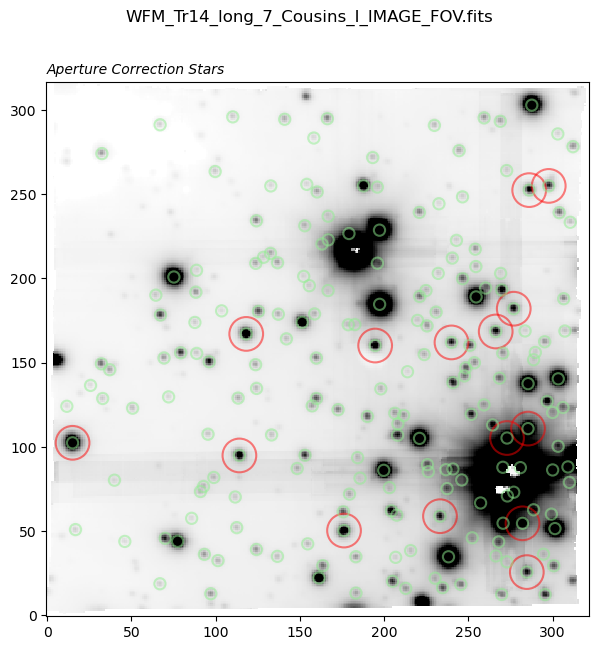

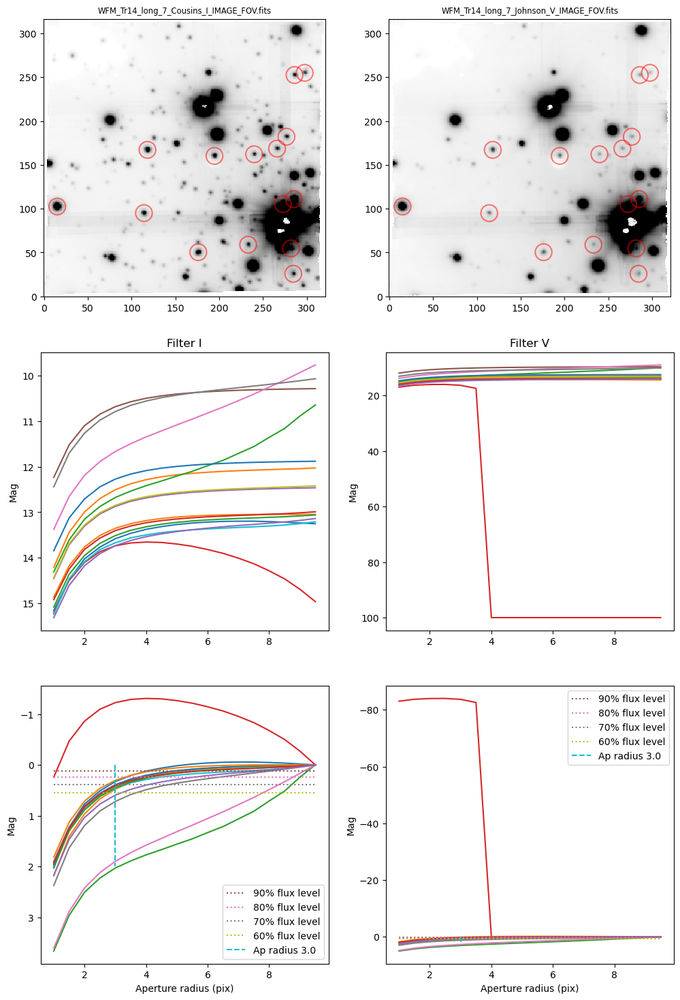

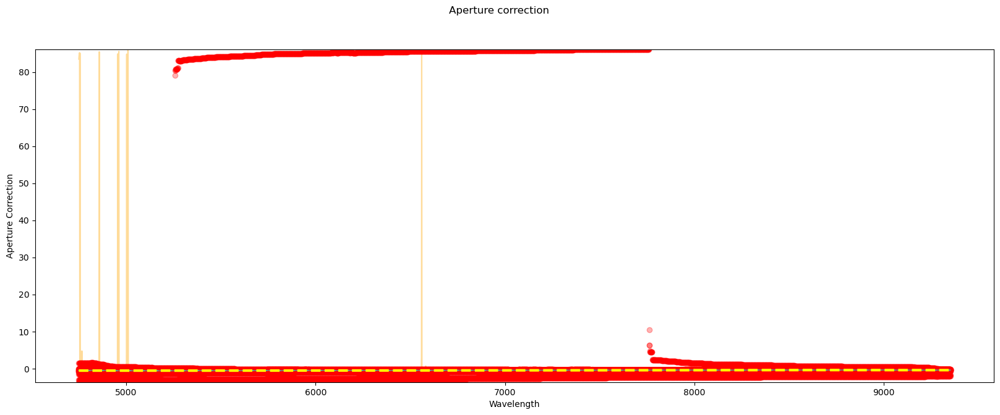

In [5]:
#for fld in ['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22']:
#for fld in ['19','20','21','22']:
run_field_reduction('7')
    

# Short exposures: Initiate the cube object


In [6]:
pars = {'code' : 1,
        'nproc' : 8,
        'datadir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+'1'+'/',
        'figdir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+'1'+'/figs/',
        'default_names' : False,
        'daofind_threshold' : 2,
        'daofind_sigma_radius' : 1.5,
        'saturation_magnitude' : -6.5,
        'file' : 'WFM_Tr14_short_'+'1'+'_DATACUBE_FINAL.fits',
        'file_i_image' : 'WFM_Tr14_short_'+'1'+'_Cousins_I_IMAGE_FOV.fits',
        'file_v_image' : 'WFM_Tr14_short_'+'1'+'_Johnson_V_IMAGE_FOV.fits'}

Filename: /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH1/WFM_Tr14_short_1_DATACUBE_FINAL.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1297   ()      
  1  DATA          1 ImageHDU        41   (318, 317, 3682)   float32   
  2  STAT          1 ImageHDU        42   (318, 317, 3682)   float32   
Cube wavelength axis definition: CDELT:1.25, CRVAL=4750.17626953125, CRPIX=1.0

Image stats for /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH1/WFM_Tr14_short_1_Cousins_I_IMAGE_FOV.fits: mean=253.6460723876953, median=250.26243591308594, std=30.998332977294922



  'angstrom' -> 'Angstrom'. [astropy.wcs.wcs]


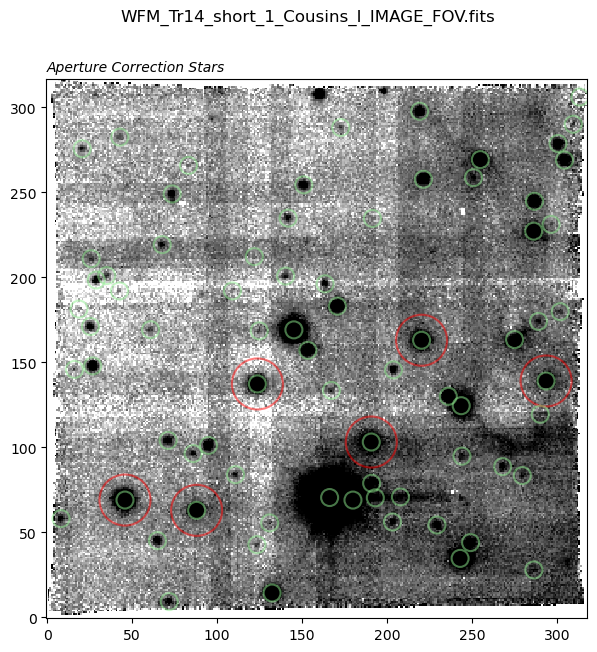

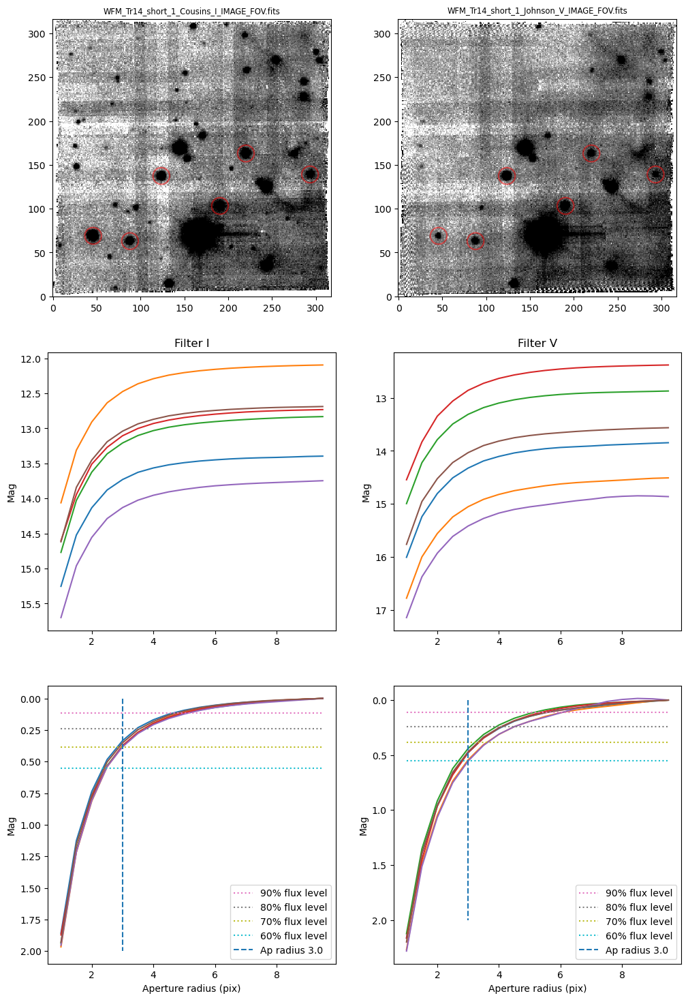

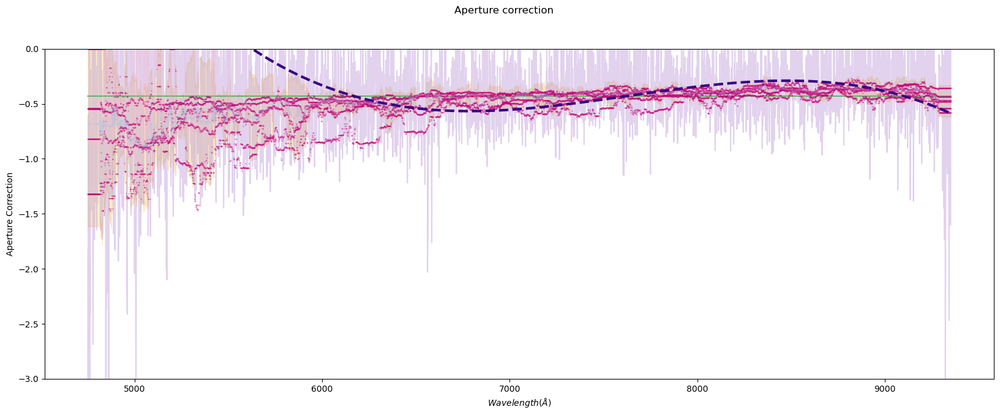

In [7]:
f1 = pSM.CubeMUSE(pars)
f1.set_stars_for_apc(magperc=15)
f1.curve_of_growth_iv()
f1.set_apc_values()


# Automatize reduction
Attempt to automatize the reduction sequence, until production of the picke file

## Field 1

Running reduction for field 1
Filename: /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH1/WFM_Tr14_short_1_DATACUBE_FINAL.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1297   ()      
  1  DATA          1 ImageHDU        41   (318, 317, 3682)   float32   
  2  STAT          1 ImageHDU        42   (318, 317, 3682)   float32   
Cube wavelength axis definition: CDELT:1.25, CRVAL=4750.17626953125, CRPIX=1.0

Image stats for /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH1/WFM_Tr14_short_1_Cousins_I_IMAGE_FOV.fits: mean=253.6460723876953, median=250.26243591308594, std=30.998332977294922



  'angstrom' -> 'Angstrom'. [astropy.wcs.wcs]


Now running the APC computation
Extracting all spectra


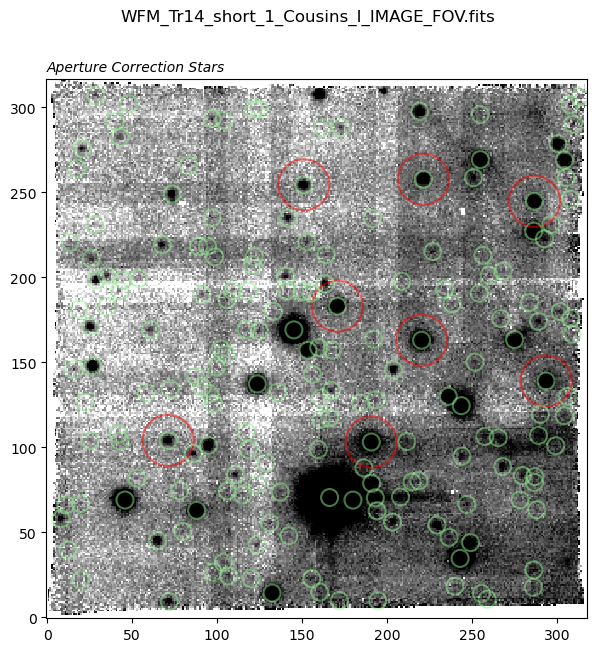

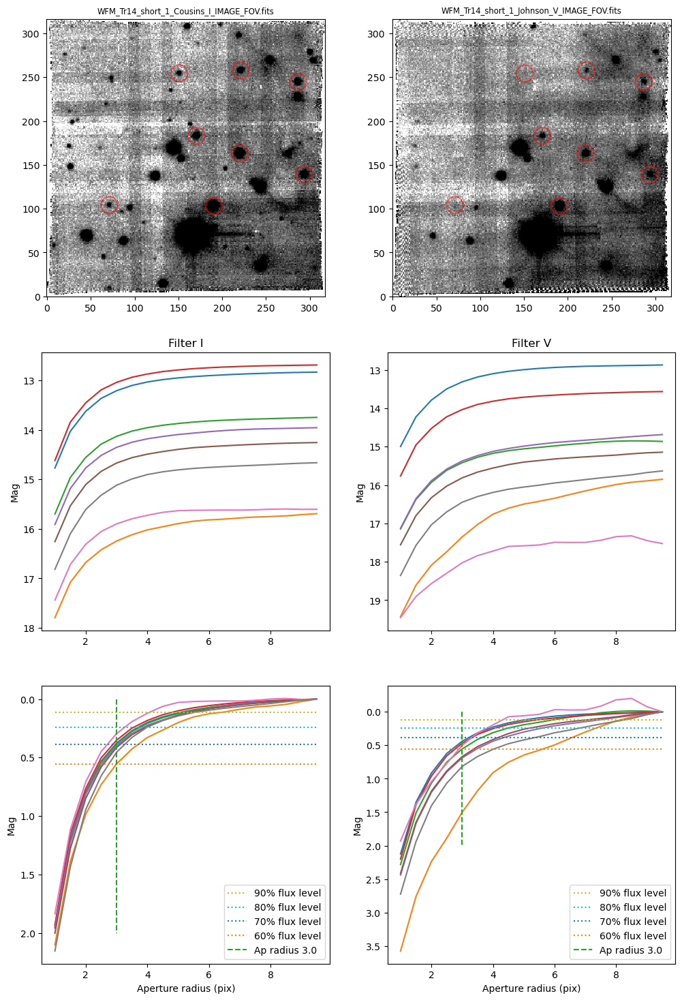

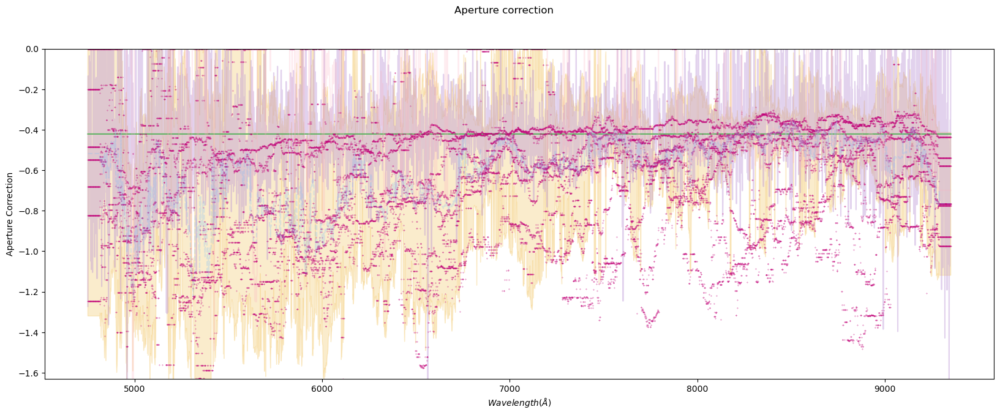

In [2]:
def run_field_reduction(field, apc_stars_perc=20): #apc_stars_perc: top percent of stars that are the brightest of the field (the super high brightness stars are not taken into consideration )
    print("Running reduction for field {0}".format(field))
    # Field 1: here I will use daofind to find stellar positions 
    pars = {'code' : field,
        'nproc' : 8,
        'datadir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+field+'/',
        'figdir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+field+'/figs/',
        'default_names' : False,
        'daofind_threshold' : 1.5,
        'daofind_sigma_radius' : 1.5,
        'saturation_magnitude' : -6.5,
        'file' : 'WFM_Tr14_short_'+field+'_DATACUBE_FINAL.fits',
        'file_i_image' : 'WFM_Tr14_short_'+field+'_Cousins_I_IMAGE_FOV.fits',
        'file_v_image' : 'WFM_Tr14_short_'+field+'_Johnson_V_IMAGE_FOV.fits'}
    #
    # Create the field
    f = pSM.CubeMUSE(pars)
    #
    # Run the daofind, the identification of APC stars, and the APC calculation
    f.set_stars_for_apc(magperc=apc_stars_perc)
    f.curve_of_growth_iv()
    print("Now running the APC computation")
    f.set_apc_values()
    #
    # Extract stellar spectra
    print("Extracting all spectra")
    #f.extract_spectra([3],(10,15),add_apc=True)
    #
    # Save the pickle file with the data
    #file = open(pars['datadir']+'field_f'+field+'_save.pkl', 'wb')
    #pickle.dump({'field' : f}, file)
    #file.close()
# Run the reduction:
run_field_reduction('1', apc_stars_perc=15) #with apc_stars_perc you can choose how many bright stars are chosen for the apc correction 

# the y xis limits are 0.1% and 99.9% 0f the magenta lines (apc_med_30)

# Field 13

Running reduction for field 13
Filename: /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH13/WFM_Tr14_short_13_DATACUBE_FINAL.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1337   ()      
  1  DATA          1 ImageHDU        41   (317, 317, 3682)   float32   
  2  STAT          1 ImageHDU        42   (317, 317, 3682)   float32   
Cube wavelength axis definition: CDELT:1.25, CRVAL=4750.158203125, CRPIX=1.0

Image stats for /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH13/WFM_Tr14_short_13_Cousins_I_IMAGE_FOV.fits: mean=357.26092529296875, median=252.83316040039062, std=287.6521301269531



  'angstrom' -> 'Angstrom'. [astropy.wcs.wcs]


Now running the APC computation
Extracting all spectra


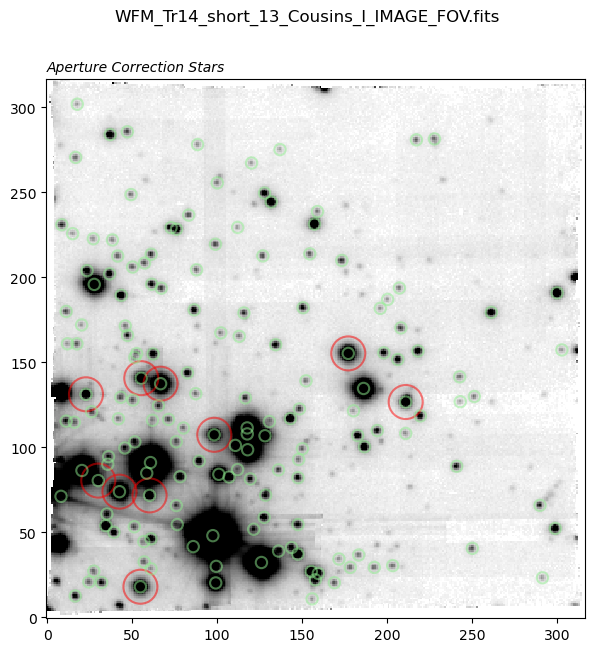

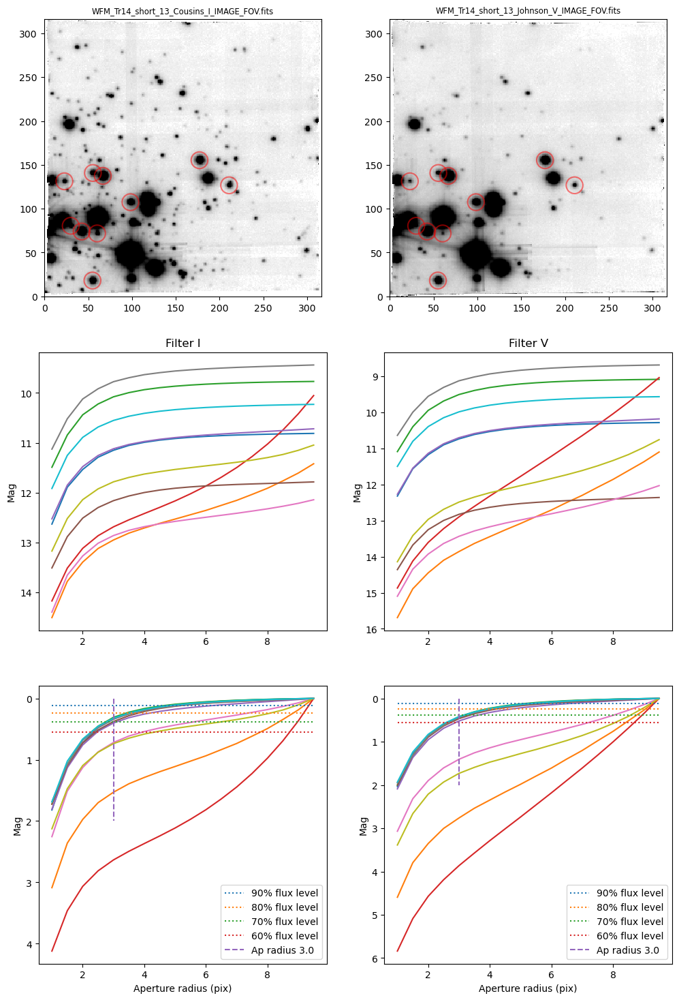

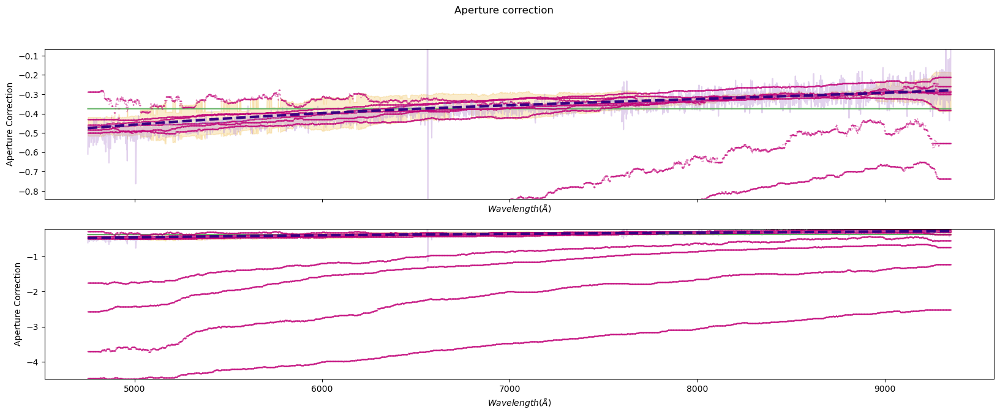

In [2]:
# Field reduction function:
def run_field_reduction(field, apc_stars_perc=20):
    print("Running reduction for field {0}".format(field))
    # Field 1: here I will use daofind to find stellar positions 
    pars = {'code' : field,
        'nproc' : 8,
        'datadir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+field+'/',
        'figdir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+field+'/figs/',
        'default_names' : False,
        'daofind_threshold' : 1.5,
        'daofind_sigma_radius' : 1.5,
        'saturation_magnitude' : -6.5,
        'file' : 'WFM_Tr14_short_'+field+'_DATACUBE_FINAL.fits',
        'file_i_image' : 'WFM_Tr14_short_'+field+'_Cousins_I_IMAGE_FOV.fits',
        'file_v_image' : 'WFM_Tr14_short_'+field+'_Johnson_V_IMAGE_FOV.fits'}
    #
    # Create the field
    f = pSM.CubeMUSE(pars)
    #
    # Run the daofind, the identification of APC stars, and the APC calculation
    f.set_stars_for_apc(magperc=apc_stars_perc)
    f.curve_of_growth_iv()
    print("Now running the APC computation")
    f.set_apc_values()
    #
    # Extract stellar spectra
    print("Extracting all spectra")
    f.extract_spectra([3],(10,15),add_apc=True)
    #
    # Save the pickle file with the data
    file = open(pars['datadir']+'field_f'+field+'_save.pkl', 'wb')
    pickle.dump({'field' : f}, file)
    file.close()

# Run the reduction:
run_field_reduction('13')


## the y axis limits are:  
## y1min = np.percentile(apc_fit(wl), 0.1) - (np.percentile(apc_fit(wl), 0.1)/1.3)*(np.percentile(apc_fit(wl), 0.1)/abs(np.percentile(apc_fit(wl), 0.1)))
## y1max = np.percentile(apc_fit(wl), 99.9) + (np.percentile(apc_fit(wl), 99.9)/1.3)*(np.percentile(apc_fit(wl), 99.9)/abs(np.percentile(apc_fit(wl), 99.9)))

# Field 7

Running reduction for field 7
Filename: /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH7/WFM_Tr14_short_7_DATACUBE_FINAL.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1333   ()      
  1  DATA          1 ImageHDU        41   (317, 317, 3682)   float32   
  2  STAT          1 ImageHDU        42   (317, 317, 3682)   float32   
Cube wavelength axis definition: CDELT:1.25, CRVAL=4750.1767578125, CRPIX=1.0

Image stats for /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH7/WFM_Tr14_short_7_Cousins_I_IMAGE_FOV.fits: mean=474.9160461425781, median=349.596923828125, std=381.9084167480469



  'angstrom' -> 'Angstrom'. [astropy.wcs.wcs]


Now running the APC computation
Extracting all spectra


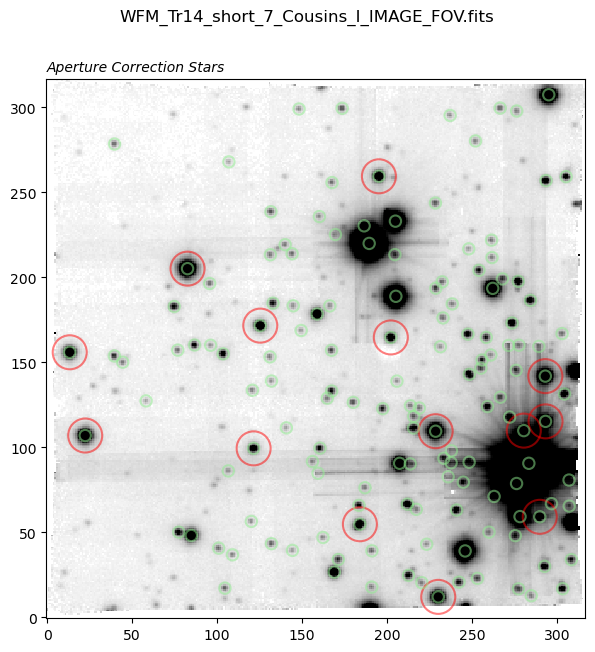

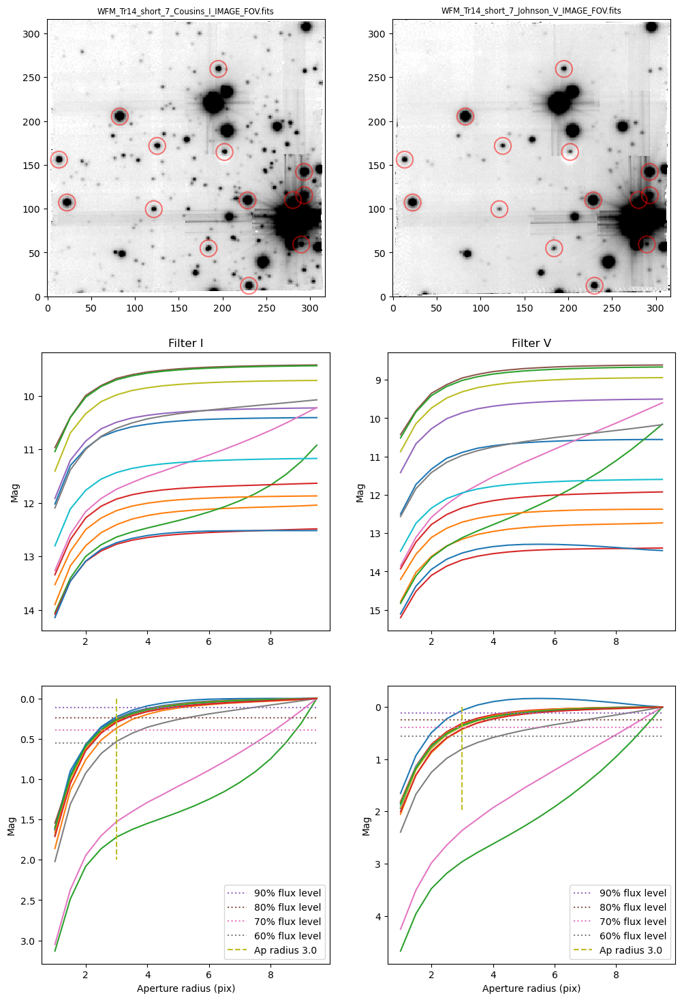

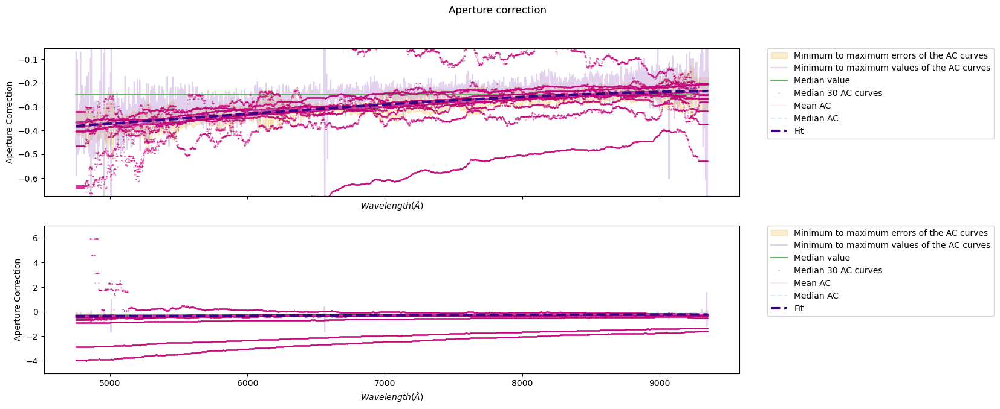

In [2]:
# Field reduction function:
def run_field_reduction(field, apc_stars_perc=20):
    print("Running reduction for field {0}".format(field))
    # Field 1: here I will use daofind to find stellar positions 
    pars = {'code' : field,
        'nproc' : 8,
        'datadir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+field+'/',
        'figdir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+field+'/figs/',
        'default_names' : False,
        'daofind_threshold' : 1.5,
        'daofind_sigma_radius' : 1.5,
        'saturation_magnitude' : -6.5,
        'file' : 'WFM_Tr14_short_'+field+'_DATACUBE_FINAL.fits',
        'file_i_image' : 'WFM_Tr14_short_'+field+'_Cousins_I_IMAGE_FOV.fits',
        'file_v_image' : 'WFM_Tr14_short_'+field+'_Johnson_V_IMAGE_FOV.fits'}
    #
    # Create the field
    f = pSM.CubeMUSE(pars)
    #
    # Run the daofind, the identification of APC stars, and the APC calculation
    f.set_stars_for_apc(magperc=apc_stars_perc)
    f.curve_of_growth_iv()
    print("Now running the APC computation")
    f.set_apc_values()
    #
    # Extract stellar spectra
    print("Extracting all spectra")
    f.extract_spectra([3],(10,15),add_apc=True)
    #
    # Save the pickle file with the data
    file = open(pars['datadir']+'sh_field_f'+field+'_save.pkl', 'wb')
    pickle.dump({'field' : f}, file)
    file.close()

# Run the reduction:
run_field_reduction('7')


## the y axis limits are:  
## y1min = np.percentile(apc_fit(wl), 0.1) - (np.percentile(apc_fit(wl), 0.1)/1.3)*(np.percentile(apc_fit(wl), 0.1)/abs(np.percentile(apc_fit(wl), 0.1)))
## y1max = np.percentile(apc_fit(wl), 99.9) + (np.percentile(apc_fit(wl), 99.9)/1.3)*(np.percentile(apc_fit(wl), 99.9)/abs(np.percentile(apc_fit(wl), 99.9)))

In [3]:
file = open('/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH7/sh_field_f7_save.pkl', 'rb')
data=pickle.load(file)
f7 = data['field']

In [4]:
dir(f7.stars[0])

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'apc_mean',
 'apc_med',
 'apc_radii',
 'apc_spec',
 'apc_star',
 'apc_std',
 'apc_wl',
 'cog_mag_i',
 'cog_mag_v',
 'cog_radii',
 'corrected_magspec',
 'corrected_spectrum',
 'daofind_mag',
 'get_line',
 'has_corrected_spectrum',
 'has_lines',
 'has_spectrum',
 'id',
 'lines',
 'magspec',
 'plot_star_summary',
 'rms_spectrum',
 'sky',
 'sky_noise',
 'skycoo',
 'spectrum',
 'starpars',
 'wl',
 'xcentroid',
 'ycentroid']

In [5]:
import astropy as ap
from astropy.table import QTable, Table, Column
from astropy import units as u

t = Table()
param_list = []

for i in range(27, len(dir(f7.stars[0]))):
    param_list.append(str(dir(f7.stars[0])[i]))
    
star_list = []
id_list = []
wl_list = []
xcentroid_list = []
ycentroid_list = []
apc_mean_list = []
apc_med_list = []
apc_radii_list = []
apc_spec_list = []
apc_star_list = []
apc_std_list = []
apc_wl_list = []
cog_mag_i_list = []
cog_mag_v_list = []
cog_radii_list = []
corrected_magspec_list = []
corrected_spectrum_list = []
daofind_mag_list = []
get_line_list = []
has_corrected_spectrum_list = []
has_lines_list = []
has_spectrum_list = []
lines_list = []
magspec_list = []
plot_star_summary_list = []
rms_spectrum_list = []
sky_list = []
sky_noise_list = []
skycoo_list = []
spectrum_list = []
starpars_list = []



for i in range(len(f7.stars)):
    star_list.append(i)
    id_list.append(f7.stars[i].id)
    wl_list.append(f7.stars[i].wl)
    xcentroid_list.append(f7.stars[i].xcentroid)
    ycentroid_list.append(f7.stars[i].ycentroid)
    apc_mean_list.append(f7.stars[i].apc_mean)
    apc_med_list.append(f7.stars[i].apc_med)
    apc_radii_list.append(f7.stars[i].apc_radii)
    apc_spec_list.append(f7.stars[i].apc_spec)
    apc_star_list.append(f7.stars[i].apc_star)
    apc_std_list.append(f7.stars[i].apc_std)
    apc_wl_list.append(f7.stars[i].apc_wl)
    cog_mag_i_list.append(f7.stars[i].cog_mag_i)
    cog_mag_v_list.append(f7.stars[i].cog_mag_v)
    cog_radii_list.append(f7.stars[i].cog_radii)
    corrected_magspec_list.append(f7.stars[i].corrected_magspec)
    corrected_spectrum_list.append(f7.stars[i].corrected_spectrum)
    daofind_mag_list.append(f7.stars[i].daofind_mag)
    get_line_list.append(f7.stars[i].get_line)
    has_corrected_spectrum_list.append(f7.stars[i].has_corrected_spectrum)
    has_lines_list.append(f7.stars[i].has_lines)
    has_spectrum_list.append(f7.stars[i].has_spectrum)
    lines_list.append(f7.stars[i].lines)
    magspec_list.append(f7.stars[i].magspec)
    plot_star_summary_list.append(f7.stars[i].plot_star_summary)
    rms_spectrum_list.append(f7.stars[i].rms_spectrum)
    sky_list.append(f7.stars[i].sky)
    sky_noise_list.append(f7.stars[i].sky_noise)
    skycoo_list.append(f7.stars[i].skycoo)
    spectrum_list.append(f7.stars[i].spectrum)
    starpars_list.append(f7.stars[i].starpars)
    

In [27]:
t['stars'] = star_list
t['id'] = id_list
t['wl'] = wl_list 
t['xcentroid'] = xcentroid_list
t['ycentroid'] = ycentroid_list
t['apc_mean'] = apc_mean_list
t['apc_radii'] = apc_radii_list
t['apc_spec'] = apc_spec_list
t['apc_star'] = apc_star_list
t['apc_std'] = apc_std_list
t['apc_wl'] = apc_wl_list
t['cog_mag_i'] = cog_mag_i_list
t['cog_mag_v'] = cog_mag_v_list
t['cog_radii'] = cog_radii_list
t['corrected_magspec'] = corrected_magspec_list
t['corrected_spectrum'] = corrected_spectrum_list
t['daofind_mag'] = daofind_mag_list
t['get_line'] = get_line_list
t['has_corrected_spectrum'] = has_corrected_spectrum_list
t['has_lines'] = has_lines_list
t['has_spectrum'] = has_spectrum_list
t['lines'] = lines_list
t['magspec'] = magspec_list
t['plot_star_summary'] = plot_star_summary_list
t['rms_spectrum'] = rms_spectrum_list
t['sky'] = sky_list
t['sky_noise'] = sky_noise_list
t['skycoo'] = skycoo_list
t['spectrum'] = spectrum_list
t['starpars'] = starpars_list



In [36]:
t

stars,id,wl,xcentroid,ycentroid,apc_mean,apc_radii,apc_spec,apc_star,apc_std,apc_wl,cog_mag_i,cog_mag_v,cog_radii,corrected_magspec,corrected_spectrum,daofind_mag,get_line,has_corrected_spectrum,has_lines,has_spectrum,lines,magspec,plot_star_summary,rms_spectrum,sky,sky_noise,skycoo,spectrum,starpars
int64,str6,float64[3682],float64,float64,object,object,object,bool,object,object,object,object,object,float64[3682],float64[3682],float64,object,bool,bool,bool,object,float64[3682],object,float64[3682],float64[3682],float64[3682],object[2],float64[3682],object
0,f7_1,4750.1767578125 .. 9351.4267578125,229.9908289598179,12.080740928344184,[-0.36493315 -0.36493315 -0.36493315 ... -0.20372617 -0.20372617\n -0.20372617],"(3.0, 10.0)",[-0.42730467 -0.46054004 -0.07078087 ... -0.14074035 -0.28293711\n 0. ],True,[0.05936099 0.05936099 0.05936099 ... 0.0487642 0.0487642 0.0487642 ],[4750.17675781 4751.42675781 4752.67675781 ... 9348.92675781 9350.17675781\n 9351.42675781],[12.01927957 11.30078154 10.97864583 10.76393028 10.65312119 10.57518\n 10.52824235 10.49222401 10.46845809 10.44902533 10.43627469 10.42690356\n 10.42054371 10.41517184 10.41124201 10.40804791 10.40586515 10.40433181],[12.50376418 11.73053548 11.3315971 11.04666001 10.89368102 10.78442671\n 10.72088975 10.6736323 10.64328235 10.61858085 10.60128866 10.58811155\n 10.57838862 10.56968702 10.56400598 10.5603128 10.55736786 10.55795253],[1. 1.5 2. 2.5 3. 3.5 4. 4.5 5. 5.5 6. 6.5 7. 7.5 8. 8.5 9. 9.5],10.939486532646612 .. 99.76419452160114,4.209256458602273e-15 .. nan,-5.292558885965395,<bound method StarMUSE.get_line of <pySpecMUSE.StarMUSE.StarMUSE object at 0x7f93846466a0>>,True,False,True,{},11.32114669932431 .. 99.999,<bound method StarMUSE.plot_star_summary of <pySpecMUSE.StarMUSE.StarMUSE object at 0x7f93846466a0>>,2.0125831395882526e-16 .. 3.170598448446125e-16,3.7780079218749995e-16 .. nan,1.0002859600333807e-15 .. nan,"<SkyCoord (ICRS): (ra, dec) in deg\n (160.99507432, -59.55135078)> .. 4.7501767578125e-07 m",2.961701738476562e-15 .. nan,"{'star_id': 'f7_1', 'xcentroid': 229.9908289598179, 'ycentroid': 12.080740928344184, 'mag': -5.292558885965395, 'skycoo': [<SkyCoord (ICRS): (ra, dec) in deg\n (160.99507432, -59.55135078)>, <SpectralCoord \n (target: <ICRS Coordinate: (ra, dec, distance) in (deg, deg, kpc)\n (161.002856, -59.5432, 1000.)\n (pm_ra_cosdec, pm_dec, radial_velocity) in (mas / yr, mas / yr, km / s)\n (0., 0., 0.)>)\n 4.75017676e-07 m>]}"
1,f7_2,4750.1767578125 .. 9351.4267578125,284.7026520489208,12.755259750714128,None,None,None,False,None,None,None,None,None,13.86471123868577 .. 99.76419452160114,2.845217718086085e-16 .. nan,-0.4560138083345743,<bound method StarMUSE.get_line of <pySpecMUSE.StarMUSE.StarMUSE object at 0x7f93846429d0>>,True,False,True,{},14.246371405363467 .. 99.999,<bound method StarMUSE.plot_star_summary of <pySpecMUSE.StarMUSE.StarMUSE object at 0x7f93846429d0>>,9.40564768135364e-17 .. 1.087024220062778e-16,3.4944893017578117e-16 .. nan,9.806583806100967e-16 .. nan,"<SkyCoord (ICRS): (ra, dec) in deg\n (160.9890764, -59.55131281)> .. 4.7501767578125e-07 m",2.0019417550048833e-16 .. nan,"{'star_id': 'f7_2', 'xcentroid': 284.7026520489208, 'ycentroid': 12.755259750714128, 'mag': -0.4560138083345743, 'skycoo': [<SkyCoord (ICRS): (ra, dec) in deg\n (160.9890764, -59.55131281)>, <SpectralCoord \n (target: <ICRS Coordinate: (ra, dec, distance) in (deg, deg, kpc)\n (161.002856, -59.5432, 1000.)\n (pm_ra_cosdec, pm_dec, radial_velocity) in (mas / yr, mas / yr, km / s)\n (0., 0., 0.)>)\n 4.75017676e-07 m>]}"
2,f7_3,4750.1767578125 .. 9351.4267578125,104.53155533262553,17.233067122187148,None,None,None,False,None,None,None,None,None,15.022218963357757 .. 99.76419452160114,9.797435536371964e-17 .. nan,-0.916032030086612,<bound method StarMUSE.get_line of <pySpecMUSE.StarMUSE.StarMUSE object at 0x7f938463ad90>>,True,False,True,{},15.403879130035454 .. 99.999,<bound method StarMUSE.plot_star_summary of <pySpecMUSE.StarMUSE.StarMUSE object at

In [46]:
t[2]['corrected_spectrum']

array([9.79743554e-17, 1.24693720e-16, 7.90706280e-17, ...,
       3.70414693e-16, 2.78594819e-16,            nan])

In [16]:
skycoo_list[0][0]

<SkyCoord (ICRS): (ra, dec) in deg
    (160.99507432, -59.55135078)>

In [31]:
print(f7.stars[1].apc_mean)

None


In [32]:
len(f7.stars)

145

In [19]:
from astroquery.gaia import Gaia
from astropy.coordinates import SkyCoord
width=5.*u.arcsec
height=5.*u.arcsec
r = Gaia.query_object_async(coordinate=SkyCoord(ra=skycoo_list[0][0].ra,dec=skycoo_list[0][0].dec,unit=(u.degree, u.degree), frame='icrs'),width=width,height=height)

INFO: Query finished. [astroquery.utils.tap.core]


In [20]:
r

dist,solution_id,DESIGNATION,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_primary_flag,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,astrometric_sigma5d_max,frame_rotator_object_type,matched_observations,duplicated_source,phot_g_n_obs,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_flux_over_error,phot_g_mean_mag,phot_bp_n_obs,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_flux_over_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,phot_variable_flag,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,epoch_photometry_url
,,,,,yr,deg,mas,deg,mas,mas,mas,,mas / yr,mas / yr,mas / yr,mas / yr,,,,,,,,,,,,,,,,,mas,,,,1 / mas2,1 / um,1 / um,,,,mas,,,,,electron / s,electron / s,,mag,,electron / s,electron / s,,mag,,electron / s,electron / s,,mag,,,mag,mag,mag,km / s,km / s,,K,log(cm.s**-2),dex,,deg,deg,deg,deg,,K,K,K,mag,mag,mag,mag,mag,mag,,solRad,solRad,solRad,solLum,solLum,solLum,,
float64,int64,object,int64,int64,float64,float64,float64,float64,float64,float64,float64,float32,float64,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,int32,int32,int32,float32,float32,float64,float64,int16,bool,float32,float64,float64,float32,int16,int16,float32,int32,int16,bool,int32,float64,float64,float32,float32,int32,float64,float64,float32,float32,int32,float64,float64,float32,float32,float32,int16,float32,float32,float32,float64,float64,int32,float32,float32,float32,object,float64,float64,float64,float64,int64,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,float32,float32,float32,float32,float32,float32,object,object
0.0006031009044635728,1635721458409799680,Gaia DR2 5350363905936141568,5350363905936141568,1689894070,2015.5,160.99523496745036,0.023581470526238654,-59.551953464540034,0.029199495302130563,0.369663170141153,0.025499260086911328,14.497016,-6.4119800461462715,0.04315398860739383,2.2191532981535502,0.05442332911295885,0.46919307,-0.16243295,0.16003677,0.4657717,0.0900938,0.451326,0.37631935,0.04226258,-0.14491338,0.46722382,168,0,168,0,-3.4340398,108.01874,0.0,0.0,31,False,60.41194,1.4788252671360413,0.00651339267698785,0.019495469,19,10,0.07111496,0,28,False,183,48882.0528924561,37.58376757537626,1300.6161,13.965492,18,23866.100658058913,159.62843999674817,149.51033,14.406935,17,47692.54493542552,137.86474278278536,345.93723,13.065794,1.4639043,0,1.3411407,0.4414425,0.89969826,--,--,0,--,--,--,NOT_AVAILABLE,287.4142970459319,-0.5762502193845875,201.7868950405121,-58.9362674866733,102001,4563.893,4378.25,5020.0,--,--,--,--,--,--,200111,6.7280407,5.56099,7.310691,17.693502,14.605307,20.781698,https://gea.esac.esa.int/data-server/datalink/links?ID=Gaia+DR2+5350363905936141568,


In [ ]:
f7.stars[0].apc_mean

In [ ]:
t['apc_mean'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)
t['apc_med'] = np.array(f7.stars[0].apc_med)


In [56]:
f7.stars[0].skycoo

[<SkyCoord (ICRS): (ra, dec) in deg
     (160.99507432, -59.55135078)>,
 <SpectralCoord 
    (target: <ICRS Coordinate: (ra, dec, distance) in (deg, deg, kpc)
                 (161.002856, -59.5432, 1000.)
              (pm_ra_cosdec, pm_dec, radial_velocity) in (mas / yr, mas / yr, km / s)
                 (0., 0., 0.)>)
   4.75017676e-07 m>]

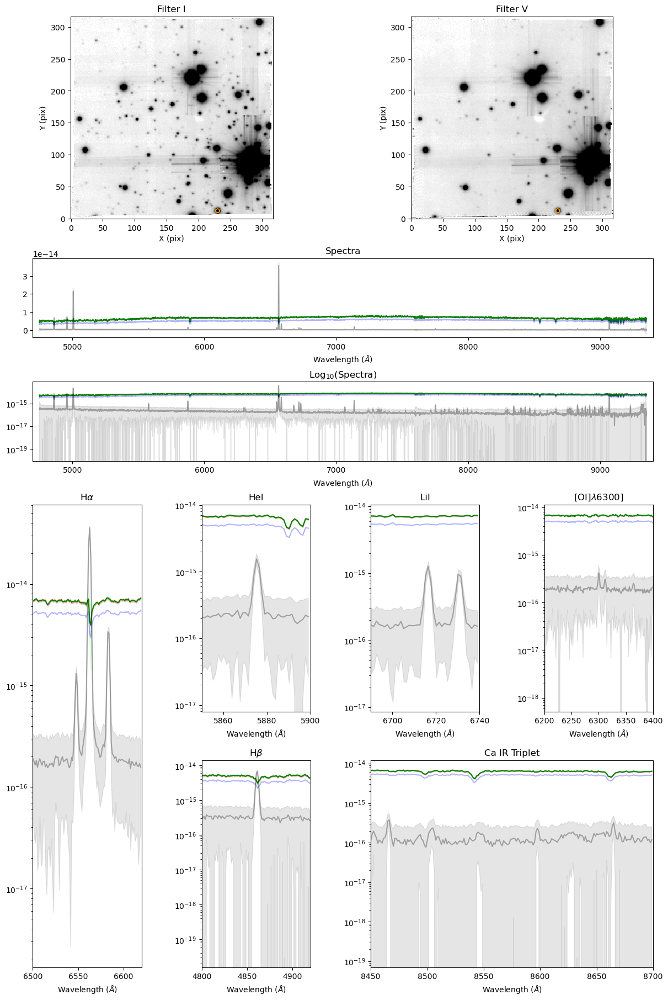

In [19]:
f7.stars[0].plot_star_summary(images={'image_V': f7.data_v, 'image_I': f7.data_i})

In [8]:
import pandas as pd 
pnd_file = pd.read_pickle('/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH7/sh_field_f7_save.pkl')

In [14]:
pnd_file['field']

# Field 10

Running reduction for field 10
Filename: /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH10/WFM_Tr14_short_10_DATACUBE_FINAL.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1341   ()      
  1  DATA          1 ImageHDU        41   (317, 317, 3682)   float32   
  2  STAT          1 ImageHDU        42   (317, 317, 3682)   float32   
Cube wavelength axis definition: CDELT:1.25, CRVAL=4750.1767578125, CRPIX=1.0

Image stats for /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH10/WFM_Tr14_short_10_Cousins_I_IMAGE_FOV.fits: mean=360.70684814453125, median=343.48406982421875, std=69.70508575439453



  'angstrom' -> 'Angstrom'. [astropy.wcs.wcs]


Now running the APC computation
Extracting all spectra


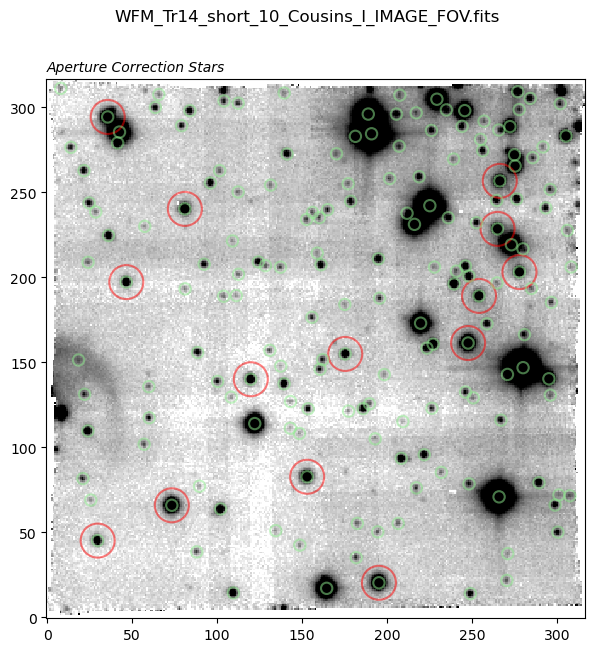

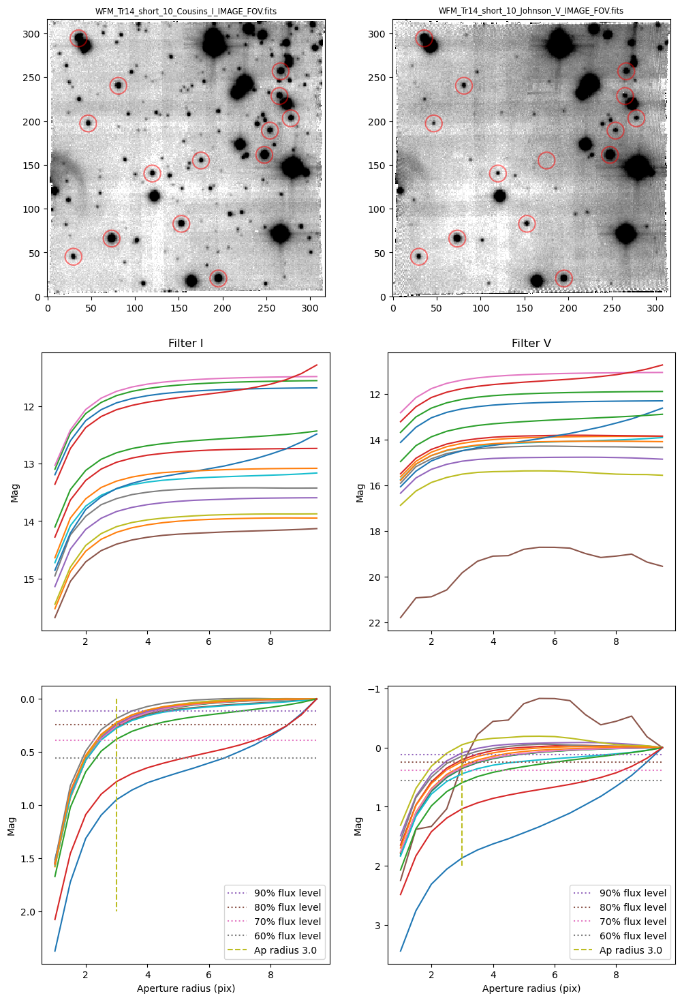

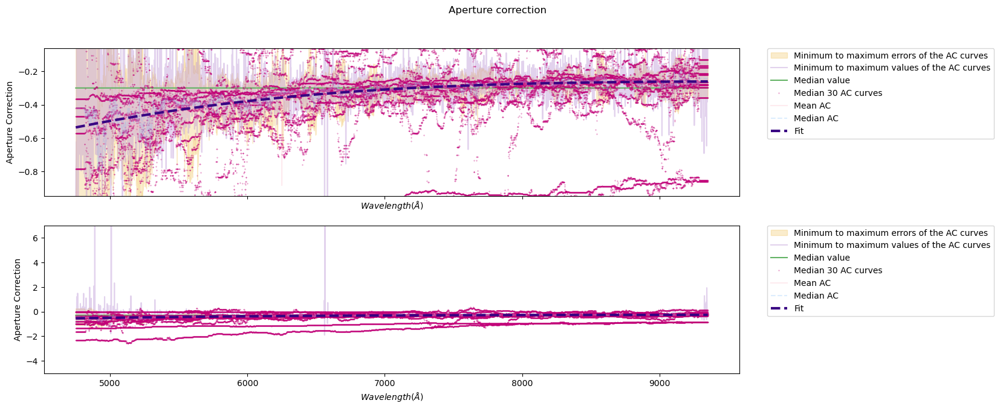

In [22]:
# Field reduction function:
def run_field_reduction(field, apc_stars_perc=20):
    print("Running reduction for field {0}".format(field))
    # Field 1: here I will use daofind to find stellar positions 
    pars = {'code' : field,
        'nproc' : 8,
        'datadir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+field+'/',
        'figdir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+field+'/figs/',
        'default_names' : False,
        'daofind_threshold' : 1.5,
        'daofind_sigma_radius' : 1.5,
        'saturation_magnitude' : -6.5,
        'file' : 'WFM_Tr14_short_'+field+'_DATACUBE_FINAL.fits',
        'file_i_image' : 'WFM_Tr14_short_'+field+'_Cousins_I_IMAGE_FOV.fits',
        'file_v_image' : 'WFM_Tr14_short_'+field+'_Johnson_V_IMAGE_FOV.fits'}
    #
    # Create the field
    f = pSM.CubeMUSE(pars)
    #
    # Run the daofind, the identification of APC stars, and the APC calculation
    f.set_stars_for_apc(magperc=apc_stars_perc)
    f.curve_of_growth_iv()
    print("Now running the APC computation")
    f.set_apc_values(hw_box_median=50, sclip_median=1.5,apc_sclip=1.8, apc_fit_order=3)

    #
    # Extract stellar spectra
    print("Extracting all spectra")
    f.extract_spectra([3],(10,15),add_apc=True)
    #
    # Save the pickle file with the data
    file = open(pars['datadir']+'sh_field_f'+field+'_save.pkl', 'wb')
    pickle.dump({'field' : f}, file)
    file.close()

# Run the reduction:
run_field_reduction('10')


## the y axis limits are:  
## y1min = np.percentile(apc_fit(wl), 0.1) - (np.percentile(apc_fit(wl), 0.1)/1.3)*(np.percentile(apc_fit(wl), 0.1)/abs(np.percentile(apc_fit(wl), 0.1)))
## y1max = np.percentile(apc_fit(wl), 99.9) + (np.percentile(apc_fit(wl), 99.9)/1.3)*(np.percentile(apc_fit(wl), 99.9)/abs(np.percentile(apc_fit(wl), 99.9)))

# Field 16

Running reduction for field 16
Filename: /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH16/WFM_Tr14_short_16_DATACUBE_FINAL.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1321   ()      
  1  DATA          1 ImageHDU        41   (317, 317, 3682)   float32   
  2  STAT          1 ImageHDU        42   (317, 317, 3682)   float32   
Cube wavelength axis definition: CDELT:1.25, CRVAL=4750.158203125, CRPIX=1.0



  'angstrom' -> 'Angstrom'. [astropy.wcs.wcs]


Image stats for /Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH16/WFM_Tr14_short_16_Cousins_I_IMAGE_FOV.fits: mean=288.8642578125, median=271.39886474609375, std=71.92013549804688

Now running the APC computation
Extracting all spectra


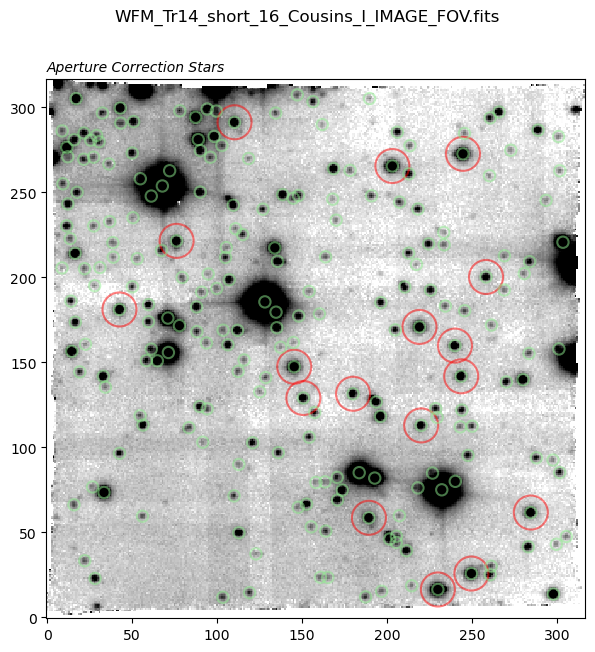

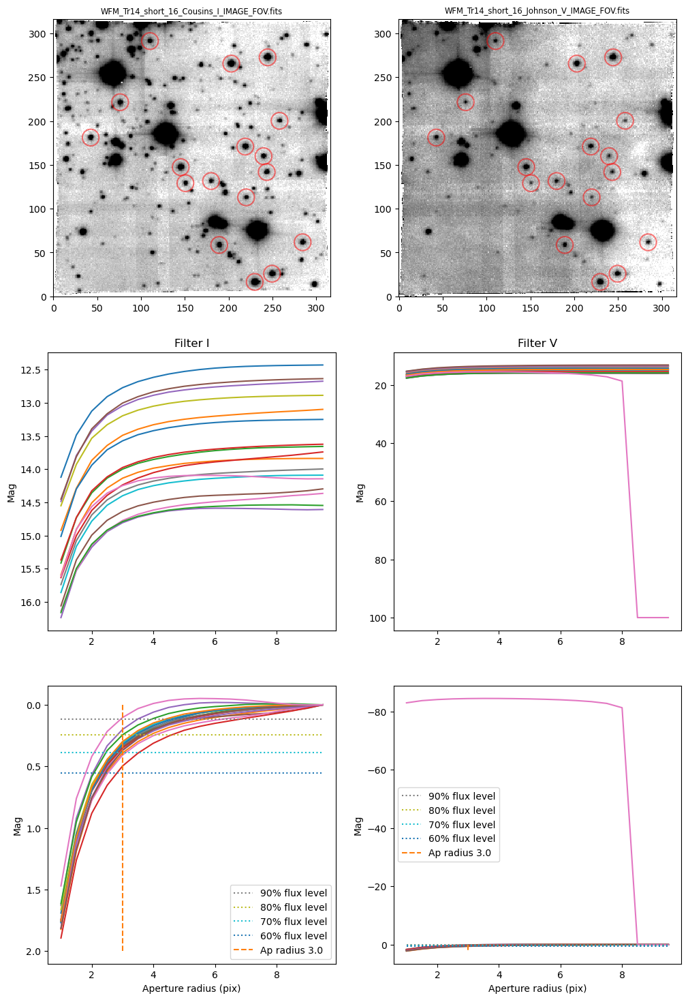

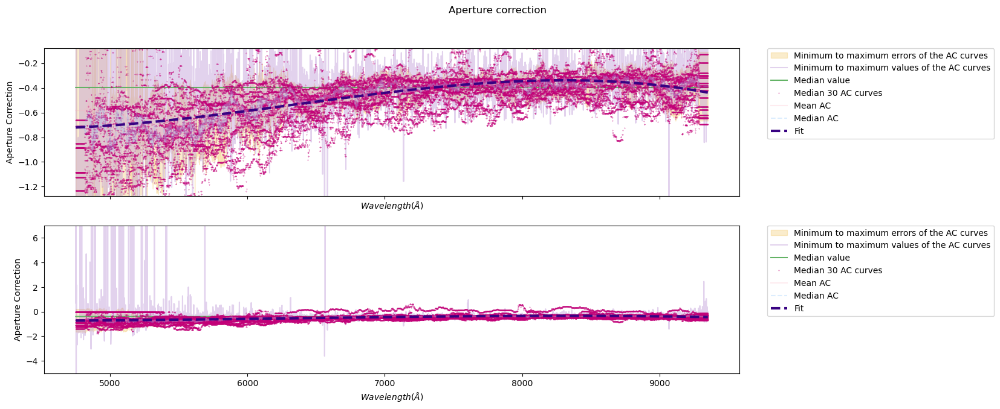

In [15]:
# Field reduction function:
def run_field_reduction(field, apc_stars_perc=20):
    print("Running reduction for field {0}".format(field))
    # Field 1: here I will use daofind to find stellar positions 
    pars = {'code' : field,
        'nproc' : 8,
        'datadir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+field+'/',
        'figdir' : '/Users/katiagim/Desktop/PhD/pySpecMUSE/Data_Cubes/SH'+field+'/figs/',
        'default_names' : False,
        'daofind_threshold' : 1.5,
        'daofind_sigma_radius' : 1.5,
        'saturation_magnitude' : -6.5,
        'file' : 'WFM_Tr14_short_'+field+'_DATACUBE_FINAL.fits',
        'file_i_image' : 'WFM_Tr14_short_'+field+'_Cousins_I_IMAGE_FOV.fits',
        'file_v_image' : 'WFM_Tr14_short_'+field+'_Johnson_V_IMAGE_FOV.fits'}
    #
    # Create the field
    f = pSM.CubeMUSE(pars)
    #
    # Run the daofind, the identification of APC stars, and the APC calculation
    f.set_stars_for_apc(magperc=apc_stars_perc)
    f.curve_of_growth_iv()
    print("Now running the APC computation")
    f.set_apc_values(hw_box_median=50, sclip_median=1.5,apc_sclip=1.8, apc_fit_order=3)
    #
    # Extract stellar spectra
    print("Extracting all spectra")
    f.extract_spectra([3],(10,15),add_apc=True)
    #
    # Save the pickle file with the data
    file = open(pars['datadir']+'sh_field_f'+field+'_save.pkl', 'wb')
    pickle.dump({'field' : f}, file)
    file.close()

# Run the reduction:
run_field_reduction('16')


## the y axis limits are:  
## y1min = np.percentile(apc_fit(wl), 0.1) - (np.percentile(apc_fit(wl), 0.1)/1.3)*(np.percentile(apc_fit(wl), 0.1)/abs(np.percentile(apc_fit(wl), 0.1)))
## y1max = np.percentile(apc_fit(wl), 99.9) + (np.percentile(apc_fit(wl), 99.9)/1.3)*(np.percentile(apc_fit(wl), 99.9)/abs(np.percentile(apc_fit(wl), 99.9)))

# Aperture Correction
Identify stars to be used for aperture correction (note that I use different limits for the brightness in the two cases, as Dominika catalog contains only the good stars). Compute and check the curve of growth in I and V for the selected stars.
Compute Apc as a function of wl for each star, then averages, with sigma clip, and fit a 3rd degree polinomial to the ApC as a function of wavelength.

# Extract the spectra of all stars
Extract spectra of all stars, add aperture corrections, and compute noises from sky and spectrum

In [14]:
# Here we extract spectra, apply the ApC derived above and compute the rms on the spectrum

f6.extract_spectra([3],(10,15),add_apc=True)
f22.extract_spectra([3],(10,15),add_apc=True)


# Saving the data
We save data and computations in a pickle object

In [15]:
file = open('field_f6_save.pkl', 'wb')
pickle.dump({'field' : f6}, file)
file.close()
file = open('field_f22_save.pkl', 'wb')
pickle.dump({'field' : f22}, file)
file.close()

# Plotting and analysis
We restore the field data, which has been saved as pickle files,
and plot/analyse the results.

In [2]:
file = open('field_f6_save.pkl', 'rb')
data=pickle.load(file)
file.close()
f6 = data['field']
file = open('field_f22_save.pkl', 'rb')
data=pickle.load(file)
file.close()
f22 = data['field']